In [1]:
from google import genai
from google.genai import types

from PIL import Image

from spatial_guidance.utils.configs import PathConfig

paths = PathConfig()

GOOGLE_API_KEY= paths.get_api_key("GOOGLE_API_KEY")
client = genai.Client(api_key=GOOGLE_API_KEY)

MODEL_ID = "gemini-2.5-pro-preview-05-06" # ["gemini-1.5-flash-latest","gemini-2.0-flash-lite","gemini-2.0-flash","gemini-2.5-pro-exp-03-25"] {"allow-input":true}

[PathConfig::get_api_key]: API key 'GOOGLE_API_KEY' loaded successfully

In [2]:
from spatial_guidance.data_handling.stray_scanner.stray_dataset import (
    StrayDatasetConfig,
)
from spatial_guidance.data_handling.stray_scanner.stray_scanner_paths import (
    StrayScannerPaths,
)
from spatial_guidance.data_handling.stray_scanner.data_parser import (
    StrayScannerDataParserConfig,
)

ds = StrayDatasetConfig(
    data_parser_config=StrayScannerDataParserConfig(
        paths=StrayScannerPaths(
            dataset_dir=paths.data / "SmartAIs-Recorded-Data/baustelle"
        )
    )
).setup_target()

In [19]:
# @title 3D box visualization code

import IPython
import json
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Polygon
from PIL import Image


def parse_json(json_output):
    # Parsing out the markdown fencing
    lines = json_output.splitlines()
    for i, line in enumerate(lines):
        if line == "```json":
            json_output = "\n".join(
                lines[i + 1 :]
            )  # Remove everything before "```json"
            json_output = json_output.split("```")[
                0
            ]  # Remove everything after the closing "```"
            break  # Exit the loop once "```json" is found
    return json_output


def visualize_3d_boxes(
    pil_image: Image.Image,
    boxes_json: str,
    fov: float = 60.0,
    zoom: float = 1.5,
    figsize: tuple = (12, 5),
    ego_marker_size: float = 0.5,
    show_grid: bool = True,
    use_distinct_bbox_colors: bool = False,
):
    """
    Draw a static two-panel visualization of 3D bounding boxes,
    with a bo-arrow ego marker and BEV frustum lines.

    Parameters
    ----------
    pil_image : PIL.Image
        Background image for the perspective view.
    boxes_json : str or list
        Either a JSON string or Python list of dicts:
          { 'label': str,
            'box_3d': [cx, cy, cz, sx, sy, sz, roll, pitch, yaw] }
        Here (cx, cy) are lateral/forward coords, so +Y = forward.
    fov : float
        Horizontal field-of-view in degrees.
    zoom : float
        BEV zoom multiplier around your data centre.
    figsize : (w, h)
        Figure size for matplotlib.
    ego_marker_size : float
        Half-width of the little bot arrow in world units.
    show_grid : bool
        Whether to display the grid lines in the BEV view.
    use_distinct_bbox_colors : bool
        If True, use distinct colors for each bounding box instead of the default colors.
    """
    # 1) parse
    boxes = json.loads(boxes_json) if isinstance(boxes_json, str) else boxes_json
    img = np.array(pil_image)
    H, W = img.shape[:2]

    # Generate distinct colors for bounding boxes if requested
    if use_distinct_bbox_colors and len(boxes) > 0:
        # Create visually distinct colors using HSV color space
        import matplotlib.colors as mcolors

        def generate_distinct_colors(n):
            # Generate evenly spaced hues
            HSVs = [(i/n, 0.9, 0.9) for i in range(n)]
            # Convert to RGB
            RGBs = [mcolors.hsv_to_rgb(hsv) for hsv in HSVs]
            return RGBs

        box_colors = generate_distinct_colors(len(boxes))
    else:
        # Default colors
        box_colors = ['cyan'] * len(boxes)  # For perspective view
        bev_colors = ['magenta'] * len(boxes)  # For BEV view

    # 2) helper: project one box into image plane
    def project_to_image(box3d):
        cx, cy, cz, sx, sy, sz, roll, pitch, yaw = box3d
        # build quaternion from rpy
        r,p,y = np.deg2rad([roll, pitch, yaw])
        sr,sp,sy_ = np.sin([r/2,p/2,y/2])
        cr,cp,cy_ = np.cos([r/2,p/2,y/2])
        q = np.array([
            sr*cp*cy_ - cr*sp*sy_,
            cr*sp*cy_ + sr*cp*sy_,
            cr*cp*sy_ - sr*sp*cy_,
            cr*cp*cy_ + sr*sp*sy_
        ])
        R = np.array([
            [1-2*(q[1]**2+q[2]**2), 2*(q[0]*q[1]-q[3]*q[2]), 2*(q[0]*q[2]+q[3]*q[1])],
            [2*(q[0]*q[1]+q[3]*q[2]), 1-2*(q[0]**2+q[2]**2), 2*(q[1]*q[2]-q[3]*q[0])],
            [2*(q[0]*q[2]-q[3]*q[1]), 2*(q[1]*q[2]+q[3]*q[0]), 1-2*(q[0]**2+q[1]**2)]
        ])
        corners = np.array([[x,y,z]
            for x in (-sx/2, sx/2)
            for y in (-sy/2, sy/2)
            for z in (-sz/2, sz/2)])
        order = [1,3,7,5,0,2,6,4]
        pts3d = (R @ corners[order].T).T + np.array([cx, cy, cz])

        # tilt camera down 90° so world‐Y→cam‐Z
        tilt = np.deg2rad(90)
        Rx = np.array([[1,0,0],[0,np.cos(tilt),-np.sin(tilt)],[0,np.sin(tilt),np.cos(tilt)]])
        pts3d = (Rx @ pts3d.T).T

        # intrinsics
        f = W/(2*np.tan(np.deg2rad(fov)/2))
        K = np.array([[f,0,W/2],[0,f,H/2],[0,0,1]])
        proj = (K @ pts3d.T).T
        pts2d = proj[:,:2] / proj[:,2,None]
        depths = pts3d[:,2]
        return pts2d, depths

    # 3) figure out BEV bounds
    xs, ys = [], []
    for b in boxes:
        box_3d = b.get('box_3d')
        if box_3d is None:
            box_3d = b.get("3d")
        if box_3d is None:
            print(f"Warning: Box does not have a valid 'box_3d' or '3d' key.")
            continue
        cx,cy,cz,sx,sy,sz,_,_,_ = box_3d
        xs += [cx - sx/2, cx + sx/2]
        ys += [cy - sy/2, cy + sy/2]
    xs.append(0); ys.append(0)
    xmin, xmax = min(xs), max(xs)
    ymin, ymax = min(ys), max(ys)
    dx, dy = max(xmax-xmin, 1e-3), max(ymax-ymin, 1e-3)
    cx_theta, cy_theta = (xmin+xmax)/2, (ymin+ymax)/2
    half_x, half_y = (dx/2)*zoom, (dy/2)*zoom

    # 4) plot
    fig = plt.figure(figsize=figsize)

    # 4a) perspective
    ax1 = fig.add_subplot(1,2,1)
    ax1.imshow(img); ax1.axis('off')
    ax1.set_title(f'Perspective (FOV={fov:.0f}°)')

    for i, b in enumerate(boxes):
        box_3d = b.get('box_3d')
        if box_3d is None:
            box_3d = b.get("3d")
        if box_3d is None:
            print(f"Warning: Box {i} does not have a valid 'box_3d' or '3d' key.")
            continue

        pts2d, depths = project_to_image(box_3d)
        dmin, dmax = depths.min(), depths.max()
        # Use the generated color if distinct colors are requested
        color = box_colors[i] if use_distinct_bbox_colors else 'cyan'

        for j in range(4):
            # top
            x0,y0 = pts2d[j]; x1,y1 = pts2d[(j+1)%4]
            w = 4 - ((depths[j]+depths[(j+1)%4])/2 - dmin)/(dmax-dmin)*3
            ax1.add_line(Line2D([x0,x1],[y0,y1], lw=w, color=color))
            # bottom
            bx0,by0 = pts2d[j+4]; bx1,by1 = pts2d[(j+1)%4+4]
            w2 = 4 - ((depths[j+4]+depths[(j+1)%4+4])/2 - dmin)/(dmax-dmin)*3
            ax1.add_line(Line2D([bx0,bx1],[by0,by1], lw=w2, color=color))
            # vertical
            ax1.add_line(Line2D([x0,bx0],[y0,by0], lw=w, color=color))
        # label
        cx2, cy2 = pts2d.mean(axis=0)
        bbox_color = color if use_distinct_bbox_colors else 'blue'
        ax1.text(cx2, cy2, b['label'],
                 color='white', ha='center', va='center',
                 bbox=dict(facecolor=bbox_color, alpha=0.6, pad=2))

    # 4b) BEV
    ax2 = fig.add_subplot(1,2,2)
    ax2.set_aspect('equal')
    ax2.set_title(f'Top View (zoom={zoom:.1f}×)')
    ax2.set_xlim(cx_theta-half_x, cx_theta+half_x)
    ax2.set_ylim(cy_theta-half_y, cy_theta+half_y)

    # Add grid only if show_grid is True
    if show_grid:
        # grid
        xt = np.arange(np.floor(cx_theta-half_x), np.ceil(cx_theta+half_x)+1)
        yt = np.arange(np.floor(cy_theta-half_y), np.ceil(cy_theta+half_y)+1)
        for x in xt: ax2.axvline(x, color='gray', lw=0.5)
        for y in yt: ax2.axhline(y, color='gray', lw=0.5)

    # 4c) frustum rays
    theta = np.deg2rad(fov/2)
    end_dist = cy_theta + half_y
    for sign in (+1, -1):
        dx = np.sin(sign*theta) * end_dist
        dy = np.cos(theta)       * end_dist
        ax2.plot([0, dx], [0, dy], '--', color='blue', lw=1.5)

    # 4d) ego marker as up‐triangle
    ax2.scatter(0, 0,
                marker='^',
                s=(ego_marker_size*200)**2,
                color='black',
                zorder=5)
    ax2.text(0, - ego_marker_size*3, 'Ego',
             color='black', ha='center', va='top',
             fontsize=9, weight='bold')

    # 4e) draw box footprints
    for i, b in enumerate(boxes):
        cx,cy,cz,sx,sy,sz,roll,pitch,yaw = b['box_3d']
        phi = np.deg2rad(yaw)
        Rz = np.array([[ np.cos(phi), -np.sin(phi)],
                       [ np.sin(phi),  np.cos(phi)]])
        rect = np.array([[-sx/2,-sy/2],
                         [ sx/2,-sy/2],
                         [ sx/2, sy/2],
                         [-sx/2, sy/2]]) @ Rz.T
        rect += np.array([cx, cy])

        # Use the generated color or default to magenta
        bev_color = box_colors[i] if use_distinct_bbox_colors else 'magenta'

        ax2.add_patch(plt.Polygon(rect, closed=True,
                                  fill=False,
                                  edgecolor=bev_color,
                                  lw=2))
        ax2.text(cx, cy, b['label'],
                 color='white', ha='center', va='center',
                 bbox=dict(facecolor=bev_color, alpha=0.6, pad=2))

    plt.tight_layout()
    plt.show()

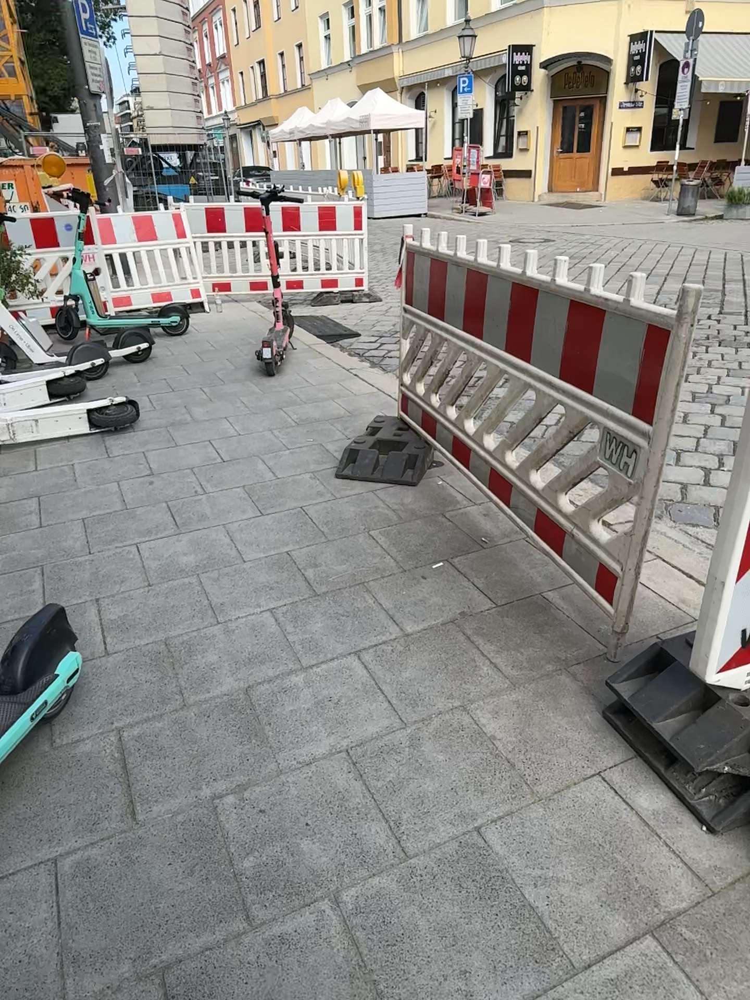

In [6]:
Image.fromarray(ds.get_rgb(300))

In [23]:

from spatial_guidance.data_contracts.obb_detection import OBBDetections, RawOBBDetection, OBBDetection
RawOBBDetection.get_json_schema(as_list=True, max_length=10)

{'$defs': {'RawOBBDetection': {'properties': {'label': {'description': 'Unique descriptive label of the detected object.',
     'type': 'string'},
    'box_3d': {'description': '3D bounding box parameters: [x_center, y_center, z_center, x_size, y_size, z_size, roll, pitch, yaw].',
     'items': {'type': 'number'},
     'maxItems': 9,
     'minItems': 9,
     'type': 'array'}},
   'required': ['label', 'box_3d'],
   'type': 'object'}},
 'items': {'$ref': '#/$defs/RawOBBDetection'},
 'maxItems': 10,
 'type': 'array'}

In [24]:
from google import genai
from google.genai import types

In [33]:
img = Image.fromarray(ds.get_rgb(idx=300))
MODEL_ID = "gemini-2.0-flash"  # Use the appropriate model ID
image_response = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        img,
      """
       Your task is to detect all relevant obstacles, hazards, and scene elements in the provided image as 3D bounding boxes.
       """
      ],
    config = types.GenerateContentConfig(
        temperature=0.5,
        response_schema=RawOBBDetection.get_json_schema(as_list=True, max_length=6),
        response_mime_type= "application/json",
        # thinking_config= types.ThinkingConfig(thinking_budget=1024),
    )
)

print(image_response.text)

AFC is enabled with max remote calls: 10.
HTTP Request: POST https://generativelanguage.googleapis.com/v1beta/models/gemini-2.0-flash:generateContent "HTTP/1.1 200 OK"
AFC remote call 1 is done.
[
  {"label": "barricade", "box_3d": [0.53,2.38,0.38,0.47,0.86,1.58,-62,-12,24]},
  {"label": "scooter", "box_3d": [-1.57,3.62,0.9,0.52,0.57,0.81,30,1,-1]},
  {"label": "barricade", "box_3d": [-1.04,4.29,1.33,0.47,0.49,1.76,101,-59,-89]},
  {"label": "scooter", "box_3d": [-0.62,3.98,1.04,0.24,0.55,0.75,30,0,0]},
  {"label": "scooter", "box_3d": [-1.6,3.19,0.51,0.25,0.44,0.97,73,-59,-89]},
  {"label": "scooter", "box_3d": [-0.97,1.65,-0.36,0.2,0.38,0.84,138,-59,-89]}
]


In [34]:
response = parse_json(image_response.text)
response

'[\n  {"label": "barricade", "box_3d": [0.53,2.38,0.38,0.47,0.86,1.58,-62,-12,24]},\n  {"label": "scooter", "box_3d": [-1.57,3.62,0.9,0.52,0.57,0.81,30,1,-1]},\n  {"label": "barricade", "box_3d": [-1.04,4.29,1.33,0.47,0.49,1.76,101,-59,-89]},\n  {"label": "scooter", "box_3d": [-0.62,3.98,1.04,0.24,0.55,0.75,30,0,0]},\n  {"label": "scooter", "box_3d": [-1.6,3.19,0.51,0.25,0.44,0.97,73,-59,-89]},\n  {"label": "scooter", "box_3d": [-0.97,1.65,-0.36,0.2,0.38,0.84,138,-59,-89]}\n]'

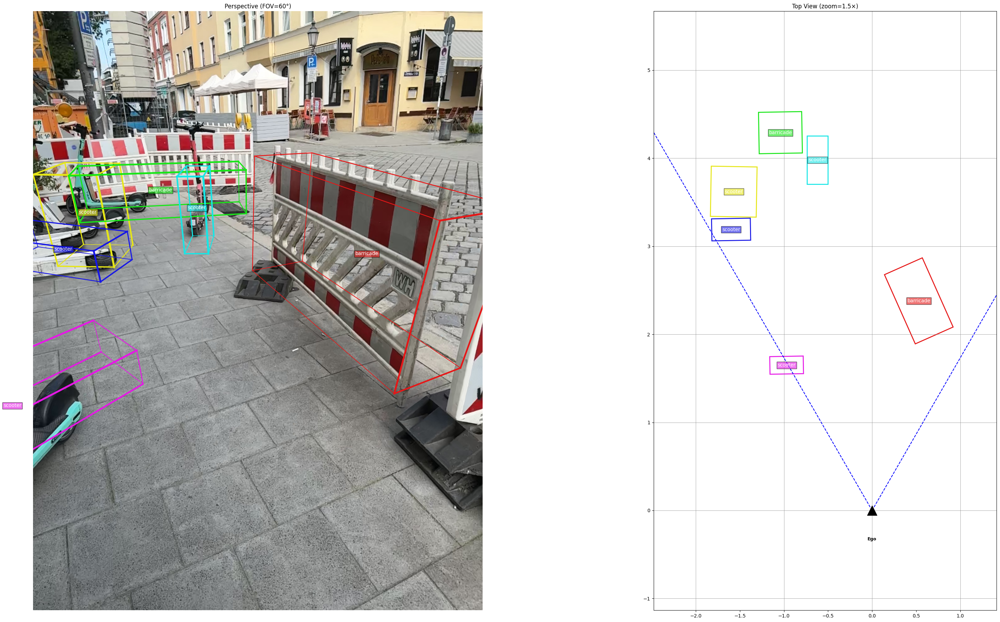

In [35]:
# Display the 3D bounding boxes

# Example using the new parameters
visualize_3d_boxes(img, parse_json(image_response.text), figsize=(36, 18), show_grid=True, use_distinct_bbox_colors=True, ego_marker_size=0.1)